based on https://jhat.readthedocs.io/en/latest/examples/plot_b_nircam.html


# JWST NIRCAM

Aligning JWST/NIRCAM images with JHAT.


An example NIRCam Dataset is downloaded, and then a series of
alignment methods are used. For more information on the
key parameters used for alignment see 
`params:Useful Parameters`.

In [2]:
import sys,os,glob
import pandas as pd
from astropy.io import fits
from astropy.table import Table
from astropy.nddata import extract_array
from astropy.coordinates import SkyCoord
from astropy import wcs
from astropy.wcs.utils import skycoord_to_pixel
from astropy import units as u
from astropy.stats import sigma_clipped_stats
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from astroquery.mast import Observations
from astropy.visualization import (simple_norm,LinearStretch)
from astroquery.gaia import Gaia
from jwst.datamodels import ImageModel

from scipy.ndimage import binary_dilation
from copy import deepcopy

import jhat
from jhat import jwst_photclass,st_wcs_align, hst_photclass

from nbutils import xmatch_common

## Relative Alignment

**Create a Photometric Catalog for Relative Alignment**

We choose one of the images to be the reference image, and then 
create a catalog that we will use to align the other image.



In [83]:
ref_image = glob.glob('jwstred_temp_gaia/f277w_jhat_i2d.fits')[0]

In [84]:
jwst_phot = jwst_photclass()
jwst_phot.run_phot(imagename=ref_image,photfilename='auto',overwrite=True,ee_radius=80,use_dq=True)
ref_catname = ref_image.replace('.fits','.phot.txt') # the default
refcat = Table.read(ref_catname,format='ascii')
print(refcat)

0 jwstred_temp_gaia/f277w_jhat_i2d.phot.txt


2024-10-24 16:54:33,689 - stpipe.SourceCatalogStep - INFO - SourceCatalogStep instance created.
2024-10-24 16:54:33,860 - stpipe.SourceCatalogStep - INFO - Using APCORR reference file: /Users/aswin/crds_cache/references/jwst/nircam/jwst_nircam_apcorr_0004.fits
2024-10-24 16:54:33,864 - stpipe.SourceCatalogStep - INFO - Using ABVEGAOFFSET reference file: /Users/aswin/crds_cache/references/jwst/nircam/jwst_nircam_abvegaoffset_0002.asdf
2024-10-24 16:54:33,864 - stpipe - INFO - Instrument: NIRCAM
2024-10-24 16:54:33,865 - stpipe - INFO - Detector: NRCALONG
2024-10-24 16:54:33,865 - stpipe - INFO - Filter: F277W
2024-10-24 16:54:33,865 - stpipe - INFO - Pupil: CLEAR
2024-10-24 16:54:33,865 - stpipe - INFO - Subarray: FULL


dmag 0.36200000000000004
aper_sum_3.1px annulus_median_3.1px aper_bkg_3.1px ...   x_idl     y_idl   
-------------- -------------------- -------------- ... --------- ----------
     32.743482             0.415316      12.425693 ... 43.479657 -64.765938
      34.91476             0.331131       9.906975 ... 45.175068 -64.765808
     17.723102             0.282308        8.44627 ... 52.384012 -64.737681
      93.12083              0.77046      23.051095 ... 58.425765 -64.743491
     18.711702             0.457963       13.70163 ... 61.838519 -64.687523
    137.970653             4.183688     125.170205 ... 20.742178 -64.622353
    170.718659             3.723311     111.396374 ... 22.138594 -64.628996
     11.189172              0.22884       6.846589 ... 25.205835 -64.596996
     32.858963             0.325017       9.724053 ... 32.926848 -64.576308
     42.690499             0.585415       17.51481 ... -2.179115 -64.382083
           ...                  ...            ... ...       ..

**Align the second image**

The plots outputted here show the various steps used by jhat to
determine the true matching sources in the image, and the
subsequent correction needed for optimal alignment.



In [85]:
# align_image = glob.glob('jwstred_temp_gaia/jw01334001001_02101_00002_nrca4_cal.fits')[0]
align_image = glob.glob('jwstred_temp_gaia/jw01334001001_02101_00001_nrca1_cal.fits')[0]

In [89]:
refcat_df = pd.read_csv(ref_catname, sep = '\s+')

In [90]:
refcat_df

,aper_sum_3.1px,annulus_median_3.1px,aper_bkg_3.1px,aper_sum_bkgsub_3.1px,flux_err_3.1px,mag,dmag,x,y,sharpness,roundness1,roundness2,ra,dec,x_idl,y_idl
0,32.743482,0.415316,12.425693,26.268868,0.000797,22.930063,0.008298,1707.147576,7.267862,0.763070,0.994518,0.328032,259.258138,43.151451,43.479657,-64.765938
1,34.914760,0.331131,9.906975,32.332565,0.000741,22.704566,0.006267,1733.663413,7.289626,0.724772,-0.484005,0.024112,259.258763,43.151532,45.175068,-64.765808
2,17.723102,0.282308,8.446270,11.994016,0.000517,23.781255,0.011756,1846.327071,7.758555,0.742007,-0.152073,0.030519,259.261421,43.151871,52.384012,-64.737681
3,93.120830,0.770460,23.051095,90.593159,0.001539,21.585928,0.004652,1940.631575,7.631811,0.624712,0.769663,0.729416,259.263644,43.152162,58.425765,-64.743491
4,18.711702,0.457963,13.701630,6.477522,0.000532,24.450144,0.022316,1993.862514,8.451099,0.706605,0.036965,0.167123,259.264903,43.152312,61.838519,-64.687523
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35192,15.883481,0.494639,14.798933,1.402211,0.000467,26.111633,0.087661,1969.786806,2067.400433,0.786639,-0.242583,-0.114297,259.272998,43.116820,58.861099,65.998163
35193,94.907056,0.418536,12.522022,106.515608,0.001479,21.410133,0.003803,1915.825110,2069.380862,0.762114,-0.330632,0.222938,259.271735,43.116620,55.482365,66.072077
35194,18.185354,0.320050,9.575448,11.131747,0.000486,23.862258,0.011903,2028.212275,2068.775231,0.811447,0.023440,0.089088,259.274381,43.116976,62.519679,66.142333
35195,37.665129,0.325734,9.745523,36.097258,0.000759,22.584981,0.005755,2006.310691,2069.727512,0.772378,-0.059429,0.130520,259.273869,43.116892,61.146862,66.180169


In [93]:
hdr = fits.open(ref_image)['SCI'].header
w = wcs.WCS(hdr)
jh_radec = w.all_pix2world(refcat_df['x'], refcat_df['y'], 0)
refcat['ra'], refcat['dec'] = jh_radec[0], jh_radec[1]

In [99]:
refcat.write('jwstred_temp_gaia/f277w_jhat_i2d.phot.txt', format='ascii', overwrite=True)

In [4]:
ref_catname = 'jwstred_temp_dolphot/jhat/f277w_jhat_i2d.phot.txt'

In [ ]:
wcs_align = st_wcs_align()
align_images = glob.glob('jwstred_temp_dolphot/jhat/*04101*cal.fits')

for align_image in align_images:
    wcs_align.run_all(align_image,
                      telescope='jwst',
                      outsubdir='jwstred_temp_dolphot/jhat',
                      refcat_racol='ra',
                      refcat_deccol='dec',
                      refcat_magcol='mag',
                      refcat_magerrcol='dmag',
                      overwrite=True,
                      d2d_max=1.0,
                      showplots=2,
                      find_stars_threshold=5,
                      refcatname=ref_catname,
                      iterate_with_xyshifts = True,
                      histocut_order='dxdy',
                      sharpness_lim=(0.3,0.95),
                      roundness1_lim=(-0.7, 0.7),
                      xshift = -61,
                      yshift = 12,
                      SNR_min= 5,
                      dmag_max=0.1,
                      Nbright=800,
                      objmag_lim =(15,22),
                      slope_min = -20/2048,
                      binsize_px = 1.0)

## Align to Catalog

You can also align each image to the Gaia DR3 catalog, or you
could replace the catalog created in step one with your own
catalog of the field. 



In [57]:
# align_image = glob.glob('jwstred_temp_gaia/jw01334001001_02101_00001_nrca4_cal.fits')[0] #short wavelength
# align_image = glob.glob('jwstred_temp_gaia/jw01334001001_02101_00002_nrcblong_cal.fits')[0] #long wavelength
# align_image = glob.glob('jwstred_temp_dolphot/out_filter/f150w_i2d.fits')[0]
align_image = glob.glob('jwstred_temp_gaia/f115w_jhat_i2d.fits')[0]
# align_image = glob.glob('jwstred_temp_gaia/f277w_i2d.fits')[0] #level3 file
# align_image = glob.glob('jwstred_temp_mosaic/jw02784002001_02101_00001_nrcb1_cal.fits')[0]

In [8]:
# to plot regions in ds9
try:
    align_df = pd.read_csv(align_image.replace('.fits', '.phot_psf.txt'), sep = '\s+')
    np.savetxt(f'%s'%(align_image.replace('.fits', '_region.txt')), align_df[['x', 'y']].values, fmt='%s')
except:
    align_df = pd.read_csv(align_image.replace('_cal.fits', '.phot.txt'), sep = '\s+')
    np.savetxt(f'%s'%(align_image.replace('.fits', '_region.txt')), align_df[['x', 'y']].values, fmt='%s')    

In [9]:
_df = pd.read_csv('jwstred_temp_gaia/jw01334001001_02101_00001_nrca4_cal_region.txt', sep = '\s+', header = None)
_df[0], _df[1] = _df[0]+1, _df[1]+1
np.savetxt(f'%s'%(align_image.replace('.fits', '_region.txt')), _df.values, fmt='%s')

telescope set to jwst

### Doing photometry on jwstred_temp_gaia/f115w_jhat_i2d.fits
True ./jwstred_temp_gaia/f115w_jhat.phot.txt
photometry catalog filename: ./jwstred_temp_gaia/f115w_jhat.phot.txt
photcat ./jwstred_temp_gaia/f115w_jhat.phot.txt already exists, but recreating it since overwrite=True
Instrument: NIRCAM, aperture:NRCB4_FULL
Finding stars --- Detector: MULTIPLE, Filter: F115W
FWHM for the filter F115W: 1.298 px
Background and rms using MMMBackground and MADStdBackgroundRMS: 0.13966959714889526 0.29373869374897593


2025-04-20 02:01:48,338 - stpipe.SourceCatalogStep - INFO - SourceCatalogStep instance created.



Number of sources found in the image: 178480
-------------------------------------



2025-04-20 02:01:48,697 - stpipe.SourceCatalogStep - INFO - Using APCORR reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_apcorr_0004.fits
2025-04-20 02:01:48,701 - stpipe.SourceCatalogStep - INFO - Using ABVEGAOFFSET reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_abvegaoffset_0002.asdf
2025-04-20 02:01:48,701 - stpipe - INFO - Instrument: NIRCAM
2025-04-20 02:01:48,702 - stpipe - INFO - Detector: MULTIPLE
2025-04-20 02:01:48,702 - stpipe - INFO - Filter: F115W
2025-04-20 02:01:48,702 - stpipe - INFO - Pupil: CLEAR
2025-04-20 02:01:48,702 - stpipe - INFO - Subarray: FULL


radii:[3.287]pixels radius_sky_in:6.828999996185303 radius_sky_out:9.722999572753906  radius_for_mag:[3.287]
Performing aperture photometry for radius r = 3.2869999408721924 px
Time Elapsed: 9.587551459000679
171582 objects left after removing entries with NaNs in mag or dmag column
dmag 0.2172
SNR_min cut: 169129 objects left after removing entries dmag>0.2172 (SNR<5)
169129 out of 171582 entries remain in photometry table
Saving ./jwstred_temp_gaia/f115w_jhat.phot.txt
########### !!!!!!!!!!  INITIAL CUT on image photometry cat: starting with 171582 objects
dmag_max =0.1 CUT:
dmag 0.1
164636 left
SHARPNESS =(0.3, 0.95) CUT:
sharpness 0.95
164593 left
roundness1=(-0.7, 0.7) CUT:
roundness1 0.7
146301 left
146301 of image photometry objects pass initial cuts #1, 25281 cut
Getting Gaia and matching it: ra=218.16995193969657 dec=-44.19135762093278 radius=0.07202066245918357 deg
RA/Dec columns in reference catalog:  auto auto


2025-04-20 02:02:08,659 - stpipe - INFO - Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
Number of stars: 1013
### NO propoer motion correction!!!
Number of stars after removing nan's: 1013
########### !!!!!!!!!!  INITIAL CUT on reference catalog: starting with 1013 objects
1013 of image photometry objects pass initial cuts #1, 0 cut
Matching reference catalog Gaia
Using 146301 image objects that are in x_idl=[-31.63,202.66] and y_idl=[-31.63,105.68] range
x 10018
y 4503
Keeping 204 out of 1013 catalog objects within x=40.0-10018 and y=40.0-4503
Keeping 204  after removing NaNs from ra/dec
!! Matching 146301 image objects to 204 refcat objects!
Saving refcat file into ./jwstred_temp_gaia/f115w_jhat.refcat.txt
########### !!!!!!!!!!  INITIAL CUT on matched cat: starting with 146301 objects
d2d =2.0 CUT using gaia_d2d:
gaia_d2d 2.0
10951 left
10951 of image photometry objects pass initial cuts #1, 135350 cut
dx median: 0.0010655055675670155
dy median: 0.1259134763313341
*** Note: close plot to continue!


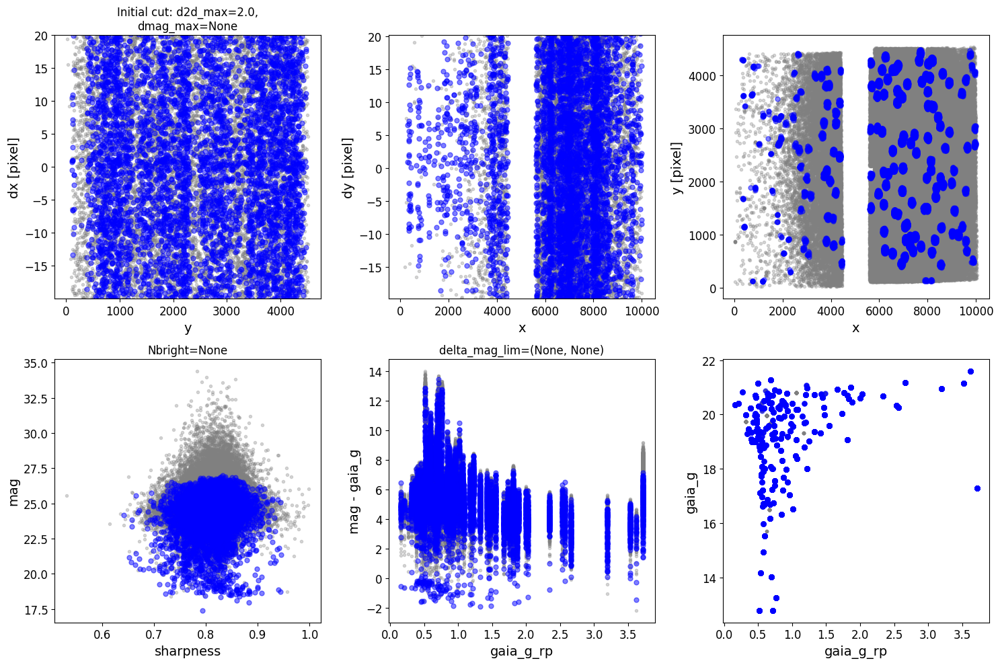

### Doing histogram cut for dx, slope_min:-0.009766 slope_max:0.009766 slope_stepsize:0.000098
Nfwhm=2.5, rough_cut_px_min=0.3, rough_cut_px_max=0.8, Nsigma=3.0
########################
### rotate dx versus y
Applying rolling gaussian:
gaussian_sigma_px=0.2, binsize=1.0, gaussian_sigma(bins)=0.2, windowsize(bins)=1 halfwindowsize(bins)=1
####BEST:
    slope  intercept  maxval  index  d_bestguess  fwhm  multimax
-0.000195   0.443652   211.0     65     0.505624  16.0     False
Setting rough_cut_px=40.0. limits: (0.3-0.8)
Setting rough_cut_px=0.8

####################
### d_rotated cut (rough_cut_px=0.8 pixels, Nsigma=3.0)
d_rot_tmp 1.305623820636444

rough_cut_px=0.8 pixels removes 10642 from 10951 entries
Keeping 309 out of 309, skippin 0 because of null values in columns d_rot_tmp
median: 0.504946
75.000000 percentile cut: max residual for cut: 0.547822
__tmp_residuals 0.5478215092012713
median: 0.526442
i:00 mean:0.526442(0.020187) stdev:0.306151(0.014243) X2norm:1.00 Nchanged:0 Ngood

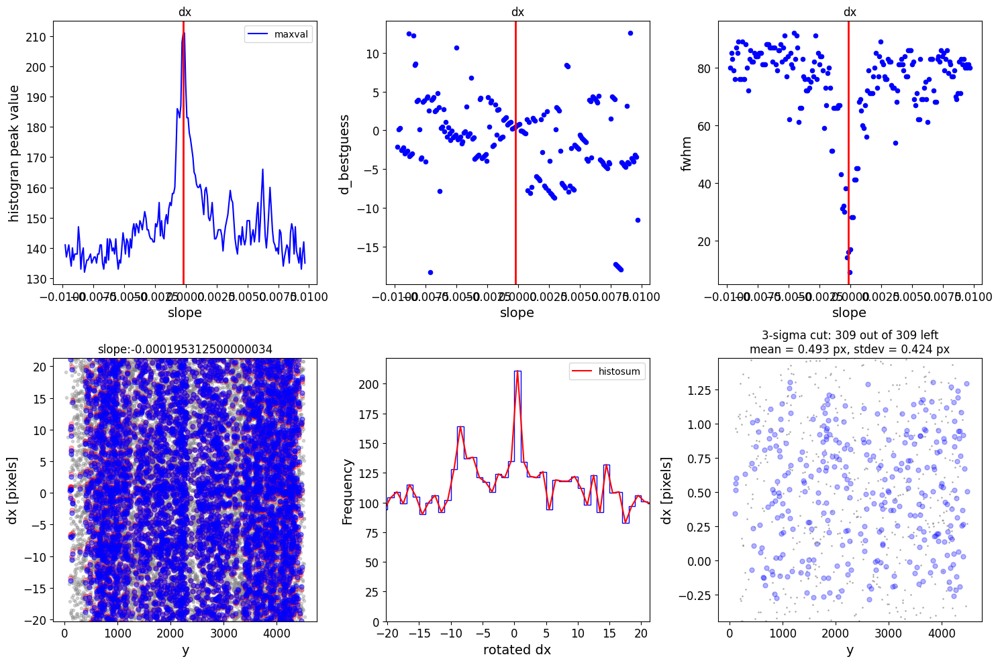

### Doing histogram cut for dy, slope_min:-0.009766 slope_max:0.009766 slope_stepsize:0.000098
Nfwhm=2.5, rough_cut_px_min=0.3, rough_cut_px_max=0.8, Nsigma=3.0
########################
### rotate dy versus x
Applying rolling gaussian:
gaussian_sigma_px=0.2, binsize=1.0, gaussian_sigma(bins)=0.2, windowsize(bins)=1 halfwindowsize(bins)=1
####BEST:
        slope    intercept  maxval  index  d_bestguess  fwhm  multimax
-3.469447e-17 1.744785e-13    40.0     65     1.086386   2.0     False
Setting rough_cut_px=5.0. limits: (0.3-0.8)
Setting rough_cut_px=0.8

####################
### d_rotated cut (rough_cut_px=0.8 pixels, Nsigma=3.0)
d_rot_tmp 1.8863863792697615

rough_cut_px=0.8 pixels removes 259 from 309 entries
Keeping 50 out of 50, skippin 0 because of null values in columns d_rot_tmp
median: 1.081976
75.000000 percentile cut: max residual for cut: 0.474831
__tmp_residuals 0.4748314506179462
median: 1.117773
i:00 mean:1.117773(0.044924) stdev:0.269545(0.031334) X2norm:0.99 Nchanged:0

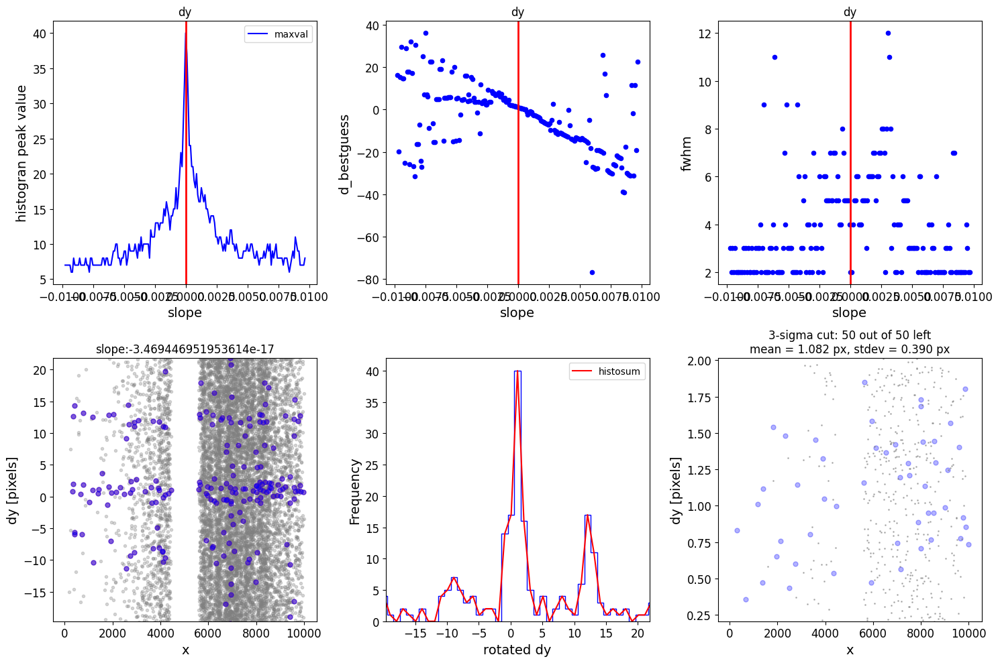

*** Note: close plots to continue!


<Figure size 640x480 with 0 Axes>

dx median of best matched objects of 1st iteration: 0.5585514970052827 dy median of best matched objects of 1st iteration: 1.0819756472604922
Matching reference catalog Gaia
Using 146301 image objects that are in x_idl=[-31.63,202.66] and y_idl=[-31.63,105.68] range
x 10018
y 4503
Keeping 204 out of 1013 catalog objects within x=40.0-10018 and y=40.0-4503
Keeping 204  after removing NaNs from ra/dec
!! Matching 146301 image objects to 204 refcat objects!
########### !!!!!!!!!!  INITIAL CUT on matched cat: starting with 146301 objects
d2d =2.0 CUT using gaia_d2d:
gaia_d2d 2.0
10973 left
10973 of image photometry objects pass initial cuts #1, 135328 cut
### Doing histogram cut for dx, slope_min:-0.009766 slope_max:0.009766 slope_stepsize:0.000098
Nfwhm=2.5, rough_cut_px_min=0.3, rough_cut_px_max=0.8, Nsigma=3.0
########################
### rotate dx versus y
Applying rolling gaussian:
gaussian_sigma_px=0.2, binsize=1.0, gaussian_sigma(bins)=0.2, windowsize(bins)=1 halfwindowsize(bins)=1


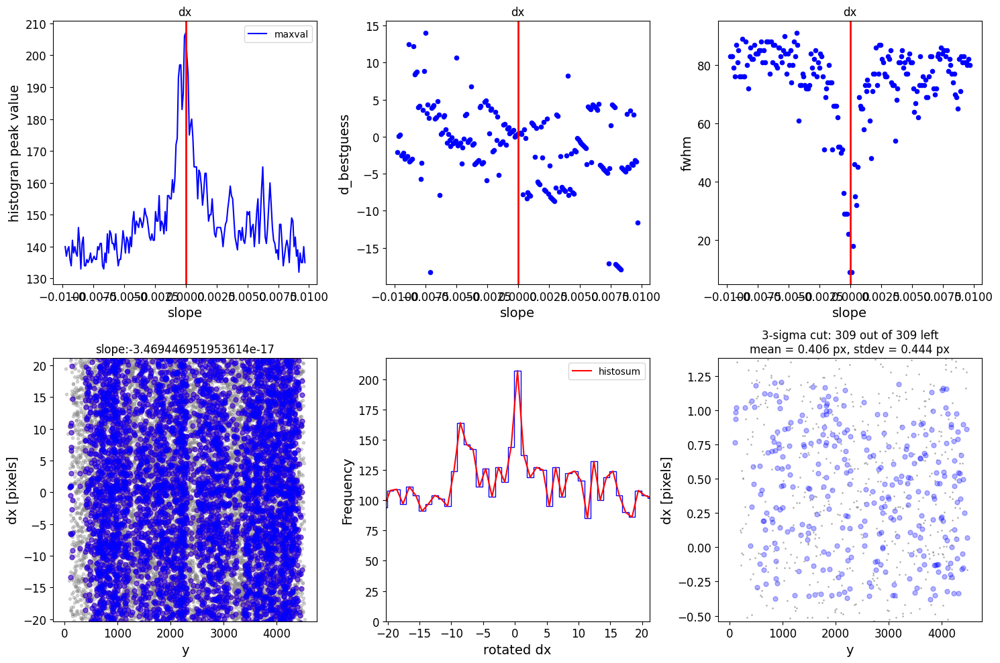

### Doing histogram cut for dy, slope_min:-0.009766 slope_max:0.009766 slope_stepsize:0.000098
Nfwhm=2.5, rough_cut_px_min=0.3, rough_cut_px_max=0.8, Nsigma=3.0
########################
### rotate dy versus x
Applying rolling gaussian:
gaussian_sigma_px=0.2, binsize=1.0, gaussian_sigma(bins)=0.2, windowsize(bins)=1 halfwindowsize(bins)=1
####BEST:
        slope    intercept  maxval  index  d_bestguess  fwhm  multimax
-3.469447e-17 1.744785e-13    36.0     64     0.851195   3.0     False
Setting rough_cut_px=7.5. limits: (0.3-0.8)
Setting rough_cut_px=0.8

####################
### d_rotated cut (rough_cut_px=0.8 pixels, Nsigma=3.0)
d_rot_tmp 1.6511946855379123

rough_cut_px=0.8 pixels removes 257 from 309 entries
Keeping 52 out of 52, skippin 0 because of null values in columns d_rot_tmp
median: 0.968070
75.000000 percentile cut: max residual for cut: 0.487899
__tmp_residuals 0.4878993949562733
median: 1.011588
i:00 mean:1.011588(0.045652) stdev:0.281416(0.031864) X2norm:0.99 Nchanged:0

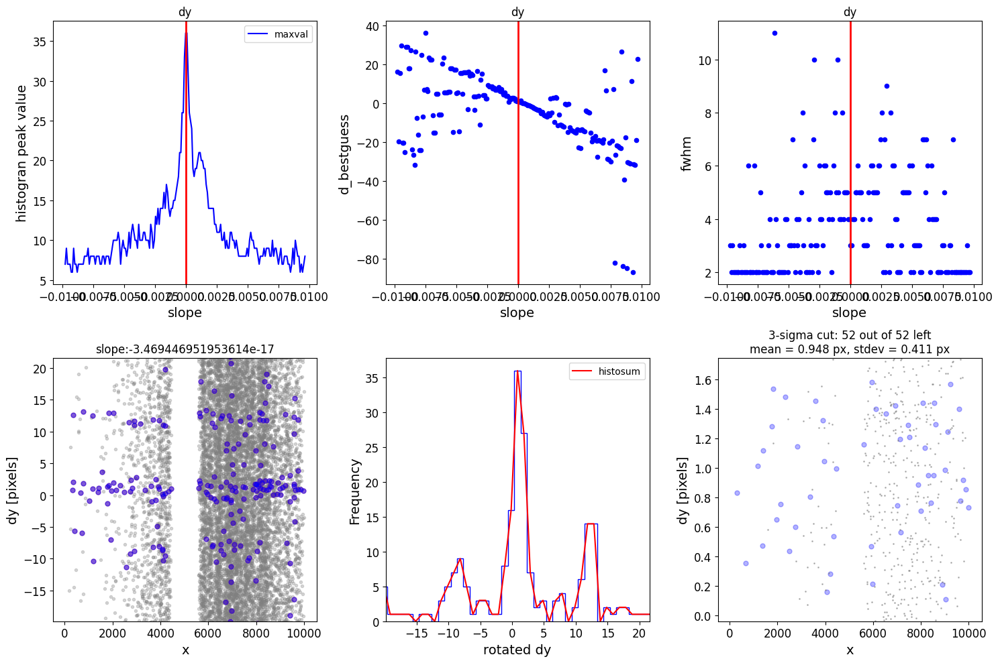

*** Note: close plots to continue!


<Figure size 640x480 with 0 Axes>

2025-04-20 02:02:48,018 - stpipe.TweakRegStep - INFO - TweakRegStep instance created.
2025-04-20 02:02:48,597 - stpipe.TweakRegStep - INFO - Step TweakRegStep running with args ([<ImageModel(4543, 10058) from f115w_jhat_i2d.fits>],).
2025-04-20 02:02:48,599 - stpipe.TweakRegStep - INFO - Step TweakRegStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: /Users/aswin/jwst123/jwstred_temp_gaia/f115w_jhat_jhat.fits
  output_dir: ./jwstred_temp_gaia
  output_ext: .fits
  output_use_model: True
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_catalogs: False
  catalog_format: ecsv
  kernel_fwhm: 2.5
  snr_threshold: 50
  brightest: 4000
  peakmax: None
  enforce_user_order: False
  expand_refcat: False
  minobj: 4
  searchrad: 0.5
  use2dhist: True
  separation: 9
  tolerance: 0.7
  xoffset: 0
  yoffset: 0
  fitgeometry: general
  nclip: 3
  sigma: 3.0
  align_to_gaia: False
  gaia_catalog: GAIADR2
  

Setting output directory for f115w_jhat_jhat.fits file to ./jwstred_temp_gaia
52 matches are passed to tweakreg general fitting
Fitting tweakreg fitgeometry=general to xy=x,y to ra,dec=gaia_ra,gaia_dec


2025-04-20 02:02:49,149 - stpipe.TweakRegStep - INFO - No matching of sources from 'GROUP ID: f115w_jhat_i2d' catalog with sources from the reference 'Unnamed' catalog was requested.
2025-04-20 02:02:49,153 - stpipe.TweakRegStep - INFO - Catalogs are assumed matched with 1-to-1 correspondence.
2025-04-20 02:02:49,153 - stpipe.TweakRegStep - INFO - Found 52 matches for 'GROUP ID: f115w_jhat_i2d'...
2025-04-20 02:02:49,154 - stpipe.TweakRegStep - INFO - Performing 'general' fit
2025-04-20 02:02:49,155 - stpipe.TweakRegStep - INFO - Computed 'general' fit for GROUP ID: f115w_jhat_i2d:
2025-04-20 02:02:49,155 - stpipe.TweakRegStep - INFO - XSH: -0.259172  YSH: 0.340727    PROPER ROT: 0.00328327    
2025-04-20 02:02:49,155 - stpipe.TweakRegStep - INFO - <ROT>: 0.00328327  SKEW: -0.000557077    ROT_X: 0.0035618  ROT_Y: 0.00300473
2025-04-20 02:02:49,155 - stpipe.TweakRegStep - INFO - <SCALE>: 1  SCALE_X: 1.00001  SCALE_Y: 0.999994
2025-04-20 02:02:49,155 - stpipe.TweakRegStep - INFO - 
2025-

WCSAXES 2 2
CRPIX1 5049.0776626127 5049.0776626127
CRPIX2 2228.5258294177 2228.5258294177
PC1_1 -0.004444655284522 -0.0045068641534799
PC1_2 0.99994124497402 0.99993458301026
PC2_1 0.99997372902751 0.99998353722135
PC2_2 0.0043851442347463 0.0044375580150151
CDELT1 8.7009838093843e-06 8.7009838093843e-06
CDELT2 8.7009838093843e-06 8.7009838093843e-06
CUNIT1 deg deg
CUNIT2 deg deg
CRVAL1 218.16944065662 218.16944081431
CRVAL2 -44.19117921958 -44.191180014934
MJD-BEG 60137.800022869 60137.800022869
MJD-AVG 60137.820451714 60137.820451714
MJD-END 60137.840907905 60137.840907905
XPOSURE 2802.294 2802.294
TELAPSE 2802.294 2802.294
OBSGEO-X 289117227.55951 289117227.55951
OBSGEO-Y -1347381024.0837 -1347381024.0837
OBSGEO-Z -1063689741.1296 -1063689741.1296
RADESYS ICRS ICRS
VELOSYS 22419.86 22419.86


2025-04-20 02:02:49,496 - stpipe.TweakRegStep - INFO - Step TweakRegStep done


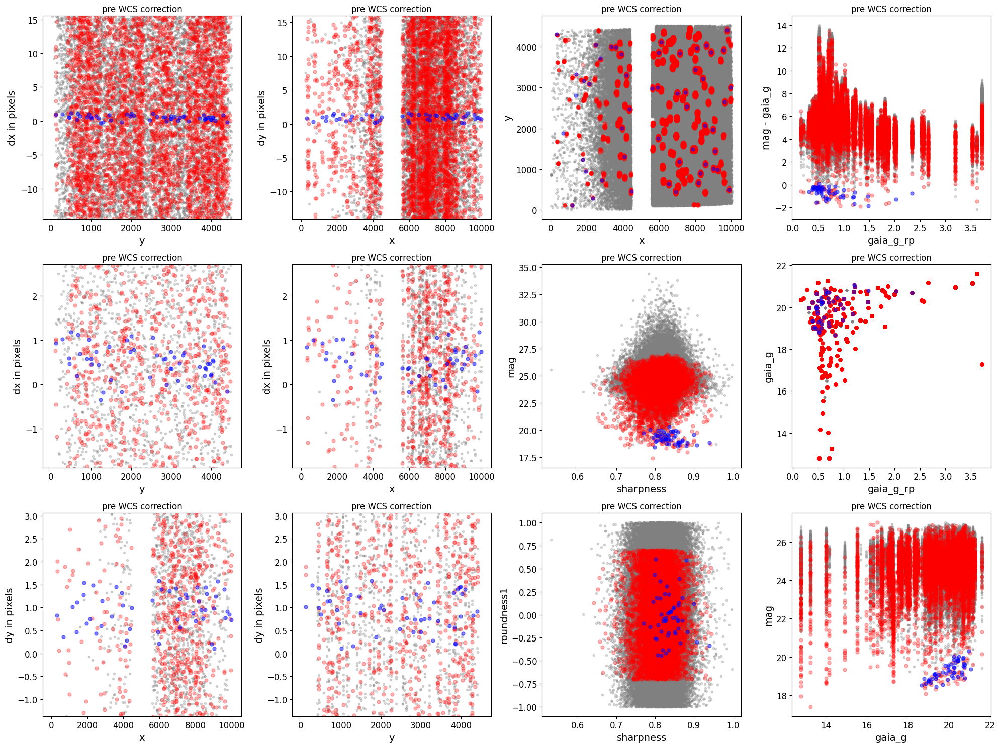

./jwstred_temp_gaia/f115w_jhat_jhat.fits
Saving ./jwstred_temp_gaia/f115w_jhat_jhat.good.phot.txt
Saving ./jwstred_temp_gaia/f115w_jhat_jhat.all.phot.txt


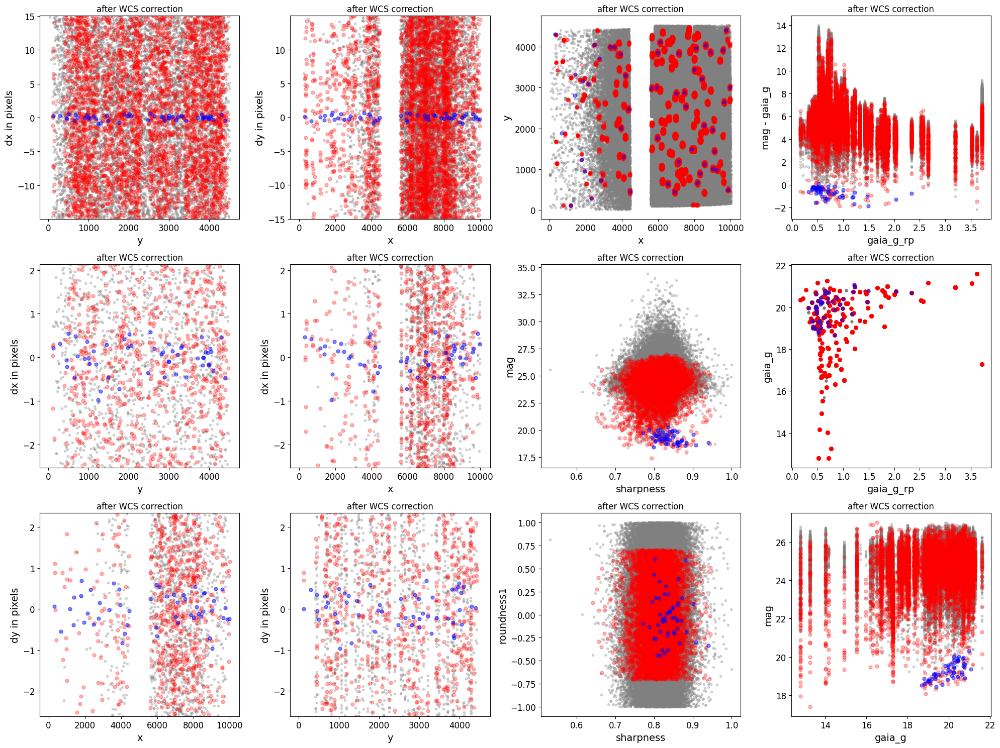

*** Note: close plots to continue!


0

In [58]:
wcs_align = st_wcs_align()
    
wcs_align.run_all(align_image,
          telescope='jwst',
          outsubdir='jwstred_temp_gaia',
          overwrite=True,
          d2d_max=2.0, 
          find_stars_threshold = 3,
          showplots=2,
          refcatname='Gaia',
          refcat_pmflag = True,
          histocut_order='dxdy',
          use_dq = False,
          verbose = True,
          iterate_with_xyshifts = True,
          xshift = 0,
          yshift = 0,
              sharpness_lim=(0.3,0.95),
              roundness1_lim=(-0.7, 0.7),
              # Nbright = 200,
              SNR_min= 5,
              dmag_max=.1,
              # objmag_lim =(15,22),
              # refmag_lim = (12,19),
              binsize_px = 1.0,
              saveplots = 0,
              slope_min = -20/2048,
              savephottable = 3)

telescope set to jwst

### Doing photometry on jwstred_temp_dolphot/f115w_jhat_i2d.fits
True ./jwstred_temp_gaia/f115w_jhat.phot.txt
photometry catalog filename: ./jwstred_temp_gaia/f115w_jhat.phot.txt
photcat ./jwstred_temp_gaia/f115w_jhat.phot.txt already exists, but recreating it since overwrite=True
Instrument: NIRCAM, aperture:NRCB4_FULL
Finding stars --- Detector: MULTIPLE, Filter: F115W
FWHM for the filter F115W: 1.298 px
Background and rms using MMMBackground and MADStdBackgroundRMS: 0.13966959714889526 0.29373869374897593


2025-04-20 01:26:01,872 - stpipe.SourceCatalogStep - INFO - SourceCatalogStep instance created.



Number of sources found in the image: 178480
-------------------------------------



2025-04-20 01:26:02,299 - stpipe.SourceCatalogStep - INFO - Using APCORR reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_apcorr_0004.fits
2025-04-20 01:26:02,303 - stpipe.SourceCatalogStep - INFO - Using ABVEGAOFFSET reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_abvegaoffset_0002.asdf
2025-04-20 01:26:02,303 - stpipe - INFO - Instrument: NIRCAM
2025-04-20 01:26:02,304 - stpipe - INFO - Detector: MULTIPLE
2025-04-20 01:26:02,304 - stpipe - INFO - Filter: F115W
2025-04-20 01:26:02,304 - stpipe - INFO - Pupil: CLEAR
2025-04-20 01:26:02,304 - stpipe - INFO - Subarray: FULL


radii:[3.287]pixels radius_sky_in:6.828999996185303 radius_sky_out:9.722999572753906  radius_for_mag:[3.287]
Performing aperture photometry for radius r = 3.2869999408721924 px
Time Elapsed: 9.632465999995475
171582 objects left after removing entries with NaNs in mag or dmag column
dmag 0.2172
SNR_min cut: 169129 objects left after removing entries dmag>0.2172 (SNR<5)
169129 out of 171582 entries remain in photometry table
Saving ./jwstred_temp_gaia/f115w_jhat.phot.txt
########### !!!!!!!!!!  INITIAL CUT on image photometry cat: starting with 171582 objects
dmag_max =0.1 CUT:
dmag 0.1
164636 left
SHARPNESS =(0.3, 0.95) CUT:
sharpness 0.95
164593 left
roundness1=(-0.7, 0.7) CUT:
roundness1 0.7
146301 left
objmag_lim=(15, 22) CUT:
mag 22
1179 left
1179 of image photometry objects pass initial cuts #1, 170403 cut
Getting Gaia and matching it: ra=218.16995193969657 dec=-44.19135762093278 radius=0.07202066245918357 deg
RA/Dec columns in reference catalog:  auto auto


2025-04-20 01:26:22,243 - stpipe - INFO - Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
Number of stars: 1013
### NO propoer motion correction!!!
Number of stars after removing nan's: 1013
########### !!!!!!!!!!  INITIAL CUT on reference catalog: starting with 1013 objects
1013 of image photometry objects pass initial cuts #1, 0 cut
Matching reference catalog Gaia
Using 1179 image objects that are in x_idl=[-28.90,202.47] and y_idl=[-31.63,104.53] range
x 10018
y 4503
Keeping 204 out of 1013 catalog objects within x=40.0-10018 and y=40.0-4503
Keeping 204  after removing NaNs from ra/dec
!! Matching 1179 image objects to 204 refcat objects!
Saving refcat file into ./jwstred_temp_gaia/f115w_jhat.refcat.txt
########### !!!!!!!!!!  INITIAL CUT on matched cat: starting with 1179 objects
d2d =0.5 CUT using gaia_d2d:
gaia_d2d 0.5
337 left
337 of image photometry objects pass initial cuts #1, 842 cut
dx median: 0.4427344164114402
dy median: 1.270690848711638
*** Note: close plot to continue!


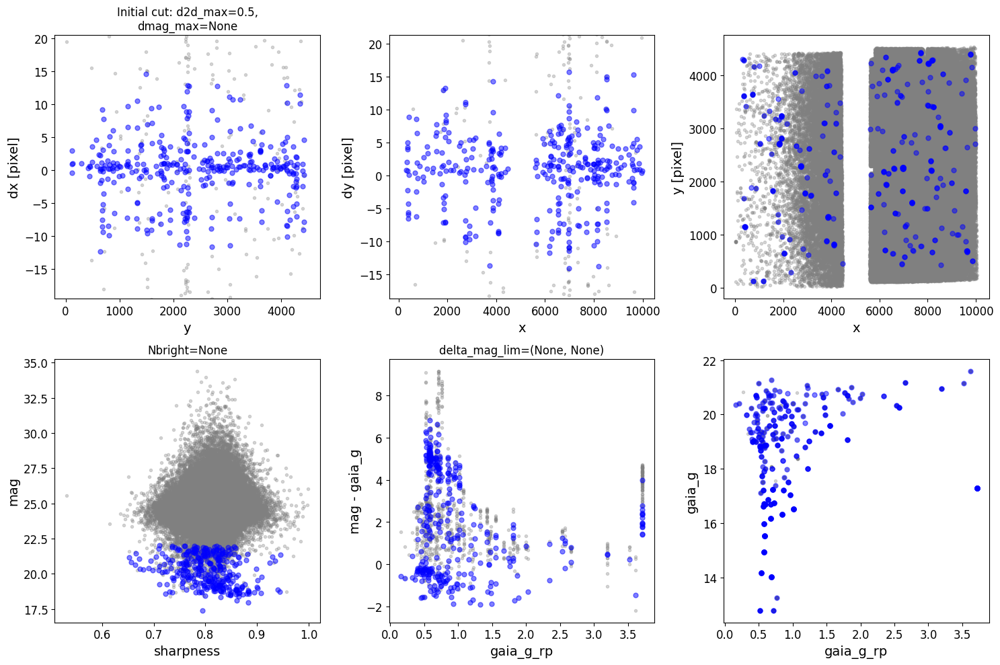

### Doing histogram cut for dx, slope_min:-0.009766 slope_max:0.009766 slope_stepsize:0.000098
Nfwhm=2.5, rough_cut_px_min=0.3, rough_cut_px_max=0.8, Nsigma=3.0
########################
### rotate dx versus y
Applying rolling gaussian:
gaussian_sigma_px=0.2, binsize=1.0, gaussian_sigma(bins)=0.2, windowsize(bins)=1 halfwindowsize(bins)=1
####BEST:
    slope  intercept  maxval  index  d_bestguess  fwhm  multimax
-0.000293   0.665479    80.0     14     0.609599   2.0     False
Setting rough_cut_px=5.0. limits: (0.3-0.8)
Setting rough_cut_px=0.8

####################
### d_rotated cut (rough_cut_px=0.8 pixels, Nsigma=3.0)
d_rot_tmp 1.4095989660538344

rough_cut_px=0.8 pixels removes 233 from 337 entries
Keeping 104 out of 104, skippin 0 because of null values in columns d_rot_tmp
median: 0.586648
75.000000 percentile cut: max residual for cut: 0.465546
__tmp_residuals 0.4655462503535268
median: 0.651778
i:00 mean:0.651778(0.030917) stdev:0.271299(0.021721) X2norm:0.99 Nchanged:0 Ngood:78 

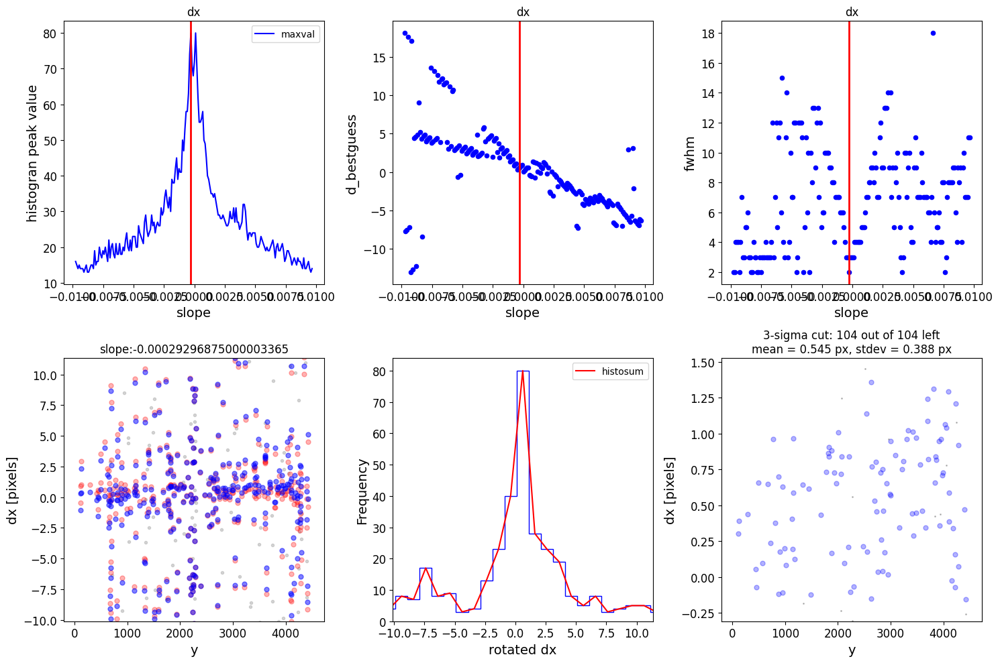

### Doing histogram cut for dy, slope_min:-0.009766 slope_max:0.009766 slope_stepsize:0.000098
Nfwhm=2.5, rough_cut_px_min=0.3, rough_cut_px_max=0.8, Nsigma=3.0
########################
### rotate dy versus x
Applying rolling gaussian:
gaussian_sigma_px=0.2, binsize=1.0, gaussian_sigma(bins)=0.2, windowsize(bins)=1 halfwindowsize(bins)=1
####BEST:
        slope    intercept  maxval  index  d_bestguess  fwhm  multimax
-3.469447e-17 1.744785e-13    35.0     11     1.227201   2.0     False
Setting rough_cut_px=5.0. limits: (0.3-0.8)
Setting rough_cut_px=0.8

####################
### d_rotated cut (rough_cut_px=0.8 pixels, Nsigma=3.0)
d_rot_tmp 2.027201219434766

rough_cut_px=0.8 pixels removes 54 from 104 entries
Keeping 50 out of 50, skippin 0 because of null values in columns d_rot_tmp
median: 1.141045
75.000000 percentile cut: max residual for cut: 0.542447
__tmp_residuals 0.5424467492920293
median: 1.117773
i:00 mean:1.117773(0.047675) stdev:0.286049(0.033253) X2norm:0.99 Nchanged:0 N

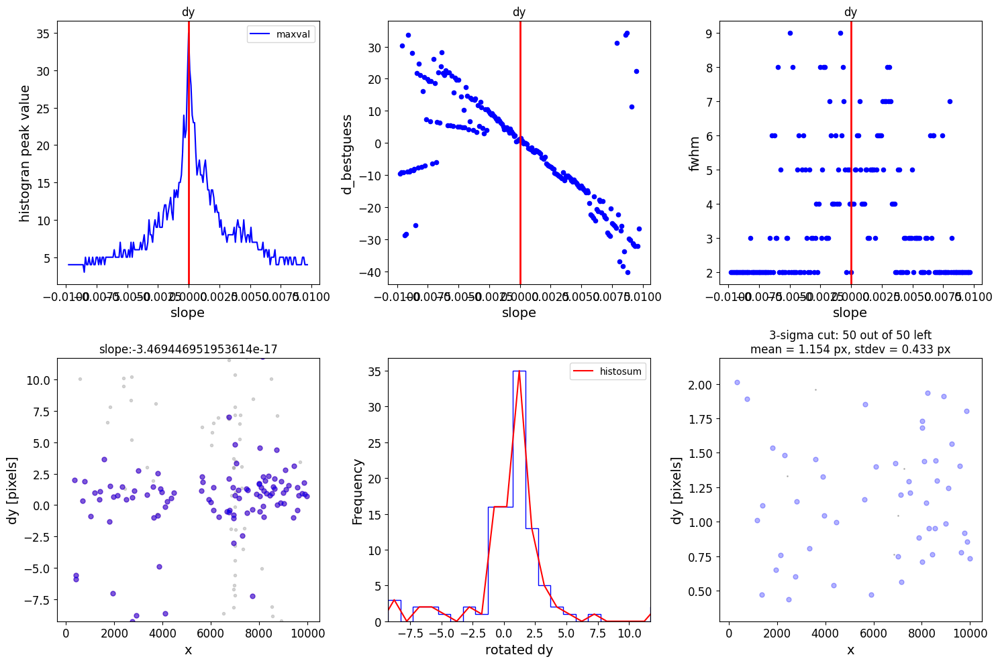

*** Note: close plots to continue!


<Figure size 640x480 with 0 Axes>

dx median of best matched objects of 1st iteration: 0.5585514970052827 dy median of best matched objects of 1st iteration: 1.1410445969044645
Matching reference catalog Gaia
Using 1179 image objects that are in x_idl=[-28.90,202.47] and y_idl=[-31.63,104.53] range
x 10018
y 4503
Keeping 204 out of 1013 catalog objects within x=40.0-10018 and y=40.0-4503
Keeping 204  after removing NaNs from ra/dec
!! Matching 1179 image objects to 204 refcat objects!
########### !!!!!!!!!!  INITIAL CUT on matched cat: starting with 1179 objects
d2d =0.5 CUT using gaia_d2d:
gaia_d2d 0.5
339 left
339 of image photometry objects pass initial cuts #1, 840 cut
### Doing histogram cut for dx, slope_min:-0.009766 slope_max:0.009766 slope_stepsize:0.000098
Nfwhm=2.5, rough_cut_px_min=0.3, rough_cut_px_max=0.8, Nsigma=3.0
########################
### rotate dx versus y
Applying rolling gaussian:
gaussian_sigma_px=0.2, binsize=1.0, gaussian_sigma(bins)=0.2, windowsize(bins)=1 halfwindowsize(bins)=1
####BEST:
   

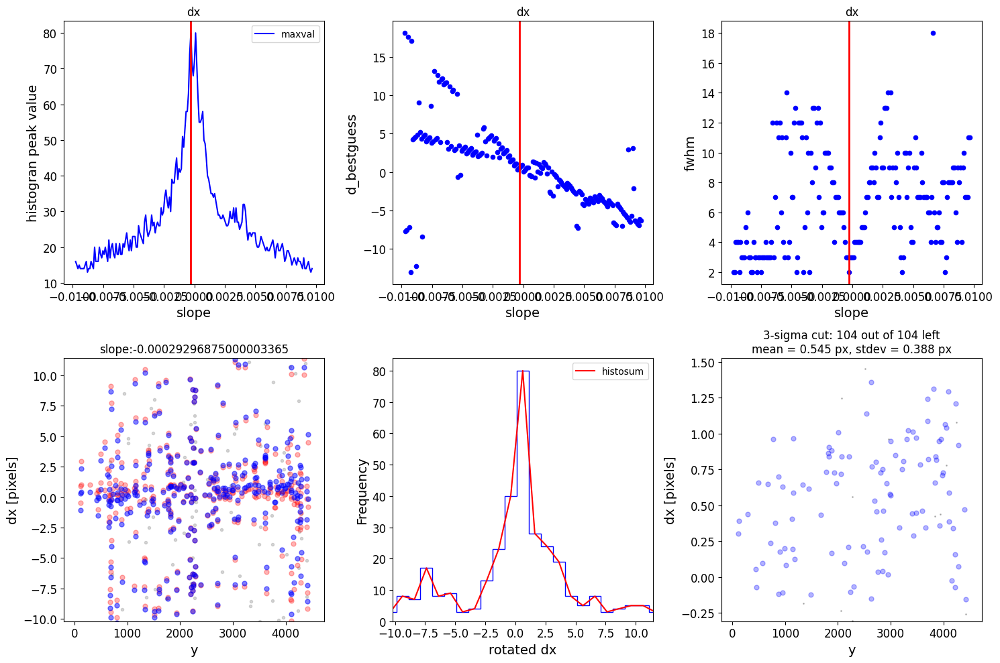

### Doing histogram cut for dy, slope_min:-0.009766 slope_max:0.009766 slope_stepsize:0.000098
Nfwhm=2.5, rough_cut_px_min=0.3, rough_cut_px_max=0.8, Nsigma=3.0
########################
### rotate dy versus x
Applying rolling gaussian:
gaussian_sigma_px=0.2, binsize=1.0, gaussian_sigma(bins)=0.2, windowsize(bins)=1 halfwindowsize(bins)=1
####BEST:
        slope    intercept  maxval  index  d_bestguess  fwhm  multimax
-3.469447e-17 1.744785e-13    35.0     11     1.227201   2.0     False
Setting rough_cut_px=5.0. limits: (0.3-0.8)
Setting rough_cut_px=0.8

####################
### d_rotated cut (rough_cut_px=0.8 pixels, Nsigma=3.0)
d_rot_tmp 2.027201219434766

rough_cut_px=0.8 pixels removes 54 from 104 entries
Keeping 50 out of 50, skippin 0 because of null values in columns d_rot_tmp
median: 1.141045
75.000000 percentile cut: max residual for cut: 0.542447
__tmp_residuals 0.5424467492920293
median: 1.117773
i:00 mean:1.117773(0.047675) stdev:0.286049(0.033253) X2norm:0.99 Nchanged:0 N

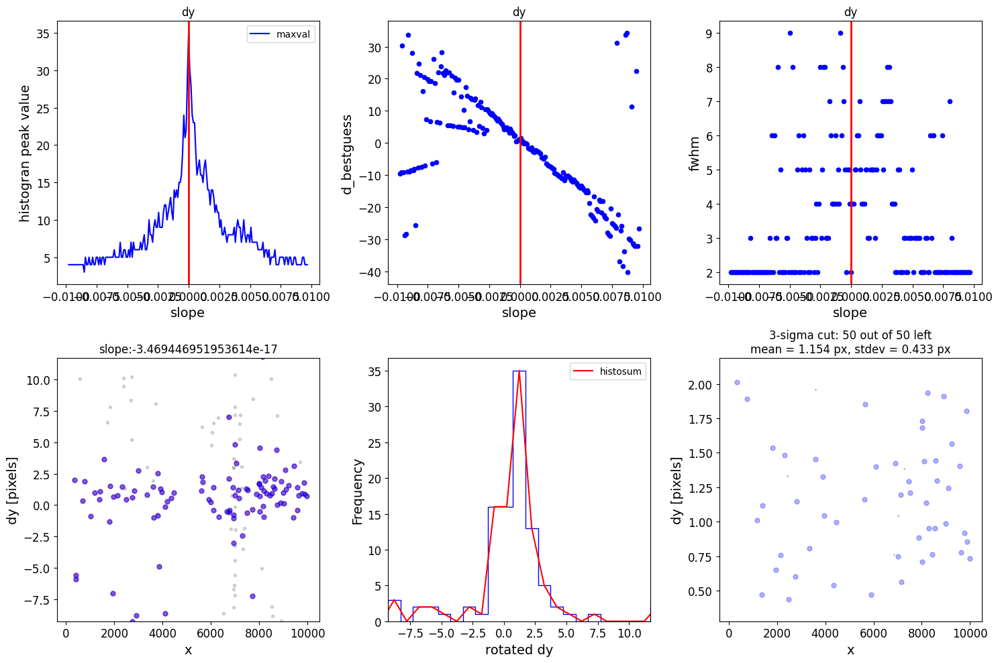

*** Note: close plots to continue!


<Figure size 640x480 with 0 Axes>

2025-04-20 01:26:52,678 - stpipe.TweakRegStep - INFO - TweakRegStep instance created.
2025-04-20 01:26:53,134 - stpipe.TweakRegStep - INFO - Step TweakRegStep running with args ([<ImageModel(4543, 10058) from f115w_jhat_i2d.fits>],).
2025-04-20 01:26:53,136 - stpipe.TweakRegStep - INFO - Step TweakRegStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: /Users/aswin/jwst123/jwstred_temp_gaia/f115w_jhat_jhat.fits
  output_dir: ./jwstred_temp_gaia
  output_ext: .fits
  output_use_model: True
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_catalogs: False
  catalog_format: ecsv
  kernel_fwhm: 2.5
  snr_threshold: 50
  brightest: 4000
  peakmax: None
  enforce_user_order: False
  expand_refcat: False
  minobj: 4
  searchrad: 0.5
  use2dhist: True
  separation: 9
  tolerance: 0.7
  xoffset: 0
  yoffset: 0
  fitgeometry: general
  nclip: 3
  sigma: 3.0
  align_to_gaia: False
  gaia_catalog: GAIADR2
  

Setting output directory for f115w_jhat_jhat.fits file to ./jwstred_temp_gaia
50 matches are passed to tweakreg general fitting
Fitting tweakreg fitgeometry=general to xy=x,y to ra,dec=gaia_ra,gaia_dec


2025-04-20 01:26:53,590 - stpipe.TweakRegStep - INFO - No matching of sources from 'GROUP ID: f115w_jhat_i2d' catalog with sources from the reference 'Unnamed' catalog was requested.
2025-04-20 01:26:53,591 - stpipe.TweakRegStep - INFO - Catalogs are assumed matched with 1-to-1 correspondence.
2025-04-20 01:26:53,591 - stpipe.TweakRegStep - INFO - Found 50 matches for 'GROUP ID: f115w_jhat_i2d'...
2025-04-20 01:26:53,591 - stpipe.TweakRegStep - INFO - Performing 'general' fit
2025-04-20 01:26:53,592 - stpipe.TweakRegStep - INFO - Computed 'general' fit for GROUP ID: f115w_jhat_i2d:
2025-04-20 01:26:53,592 - stpipe.TweakRegStep - INFO - XSH: -0.0127842  YSH: 0.496959    PROPER ROT: 0.00112423    
2025-04-20 01:26:53,592 - stpipe.TweakRegStep - INFO - <ROT>: 0.00112423  SKEW: -0.00496887    ROT_X: 0.00360867  ROT_Y: -0.0013602
2025-04-20 01:26:53,592 - stpipe.TweakRegStep - INFO - <SCALE>: 1.00001  SCALE_X: 1  SCALE_Y: 1.00002
2025-04-20 01:26:53,593 - stpipe.TweakRegStep - INFO - 
2025-

WCSAXES 2 2
CRPIX1 5049.0776626127 5049.0776626127
CRPIX2 2228.5258294177 2228.5258294177
PC1_1 -0.004444655284522 -0.0045076785419396
PC1_2 0.99994124497402 0.99995688794829
PC2_1 0.99997372902751 0.9999761791347
PC2_2 0.0043851442347463 0.0043615035905753
CDELT1 8.7009838093843e-06 8.7009838093843e-06
CDELT2 8.7009838093843e-06 8.7009838093843e-06
CUNIT1 deg deg
CUNIT2 deg deg
CRVAL1 218.16944065662 218.16944325163
CRVAL2 -44.19117921958 -44.191179663055
MJD-BEG 60137.800022869 60137.800022869
MJD-AVG 60137.820451714 60137.820451714
MJD-END 60137.840907905 60137.840907905
XPOSURE 2802.294 2802.294
TELAPSE 2802.294 2802.294
OBSGEO-X 289117227.55951 289117227.55951
OBSGEO-Y -1347381024.0837 -1347381024.0837
OBSGEO-Z -1063689741.1296 -1063689741.1296
RADESYS ICRS ICRS
VELOSYS 22419.86 22419.86


2025-04-20 01:26:53,948 - stpipe.TweakRegStep - INFO - Step TweakRegStep done


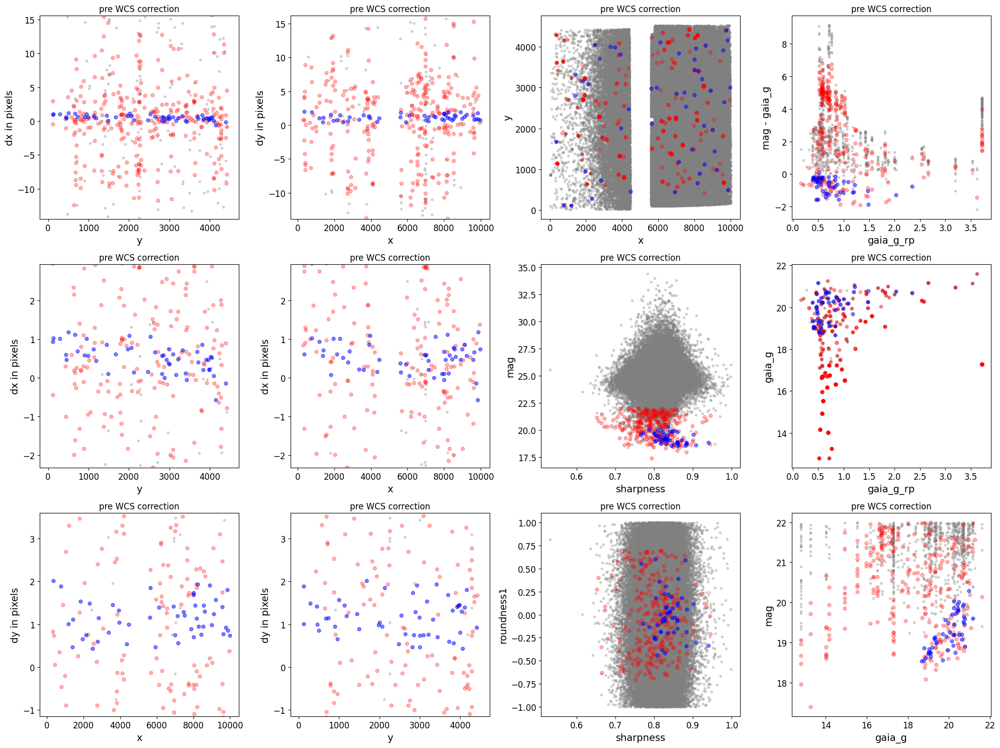

./jwstred_temp_gaia/f115w_jhat_jhat.fits
Saving ./jwstred_temp_gaia/f115w_jhat_jhat.good.phot.txt
Saving ./jwstred_temp_gaia/f115w_jhat_jhat.all.phot.txt


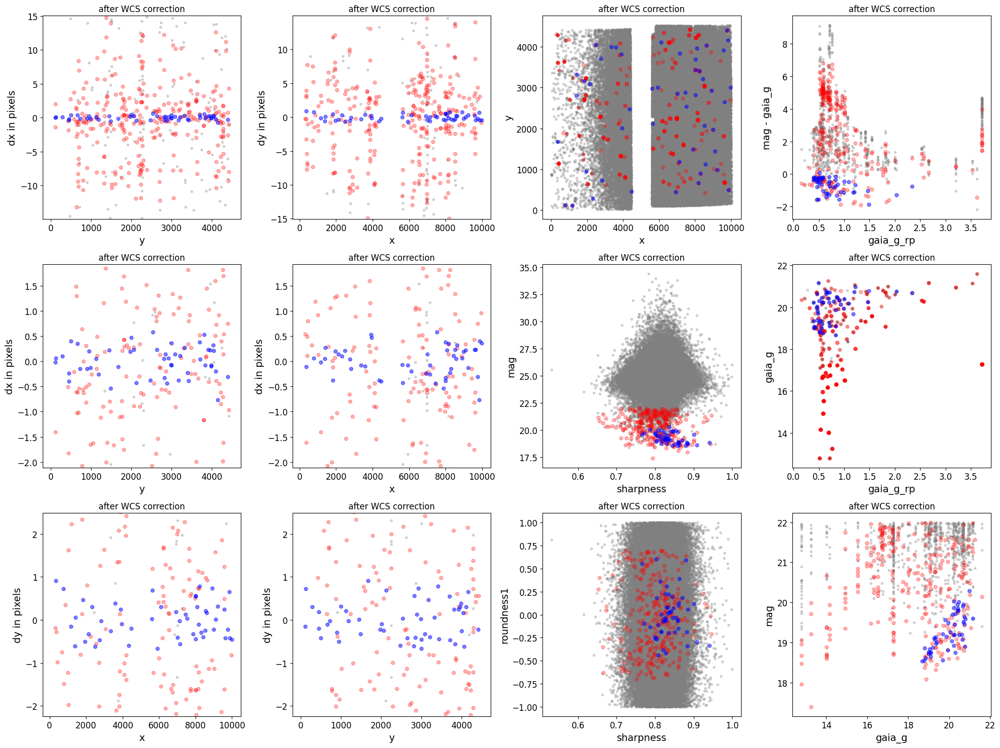

*** Note: close plots to continue!


0

In [41]:
wcs_align = st_wcs_align()
    
wcs_align.run_all(align_image,
          telescope='jwst',
          outsubdir='jwstred_temp_gaia',
          overwrite=True,
          d2d_max=0.5, 
          find_stars_threshold = 3,
          showplots=2,
          refcatname='Gaia',
          refcat_pmflag = True,
          histocut_order='dxdy',
          use_dq = False,
          verbose = True,
          iterate_with_xyshifts = True,
          xshift = 0,
          yshift = 0,
              sharpness_lim=(0.3,0.95),
              roundness1_lim=(-0.7, 0.7),
              # Nbright = 200,
              SNR_min= 5,
              dmag_max=.1,
              objmag_lim =(15,22),
              # refmag_lim = (12,19),
              binsize_px = 1.0,
              saveplots = 0,
              slope_min = -20/2048,
              savephottable = 3)

In [4]:
jhat_image = align_image.replace('i2d', 'jhat_i2d')

In [5]:
jhat_image

'f115w_jhat_jhat_i2d.fits'

In [6]:
image_model = ImageModel(jhat_image)
# phot.t[refcat_xcol], phot.t[refcat_ycol] = image_model.meta.wcs.world_to_pixel(SkyCoord(phot.t[refcat_racol],
#     phot.t[refcat_deccol],unit=u.deg))
# sc = image_model.meta.wcs.pixel_to_world(phot.t['x'],phot.t['y'])
# phot.t['ra'] = sc.ra.value
# phot.t['dec'] = sc.dec.value

In [7]:
ast_wcs

NameError: name 'ast_wcs' is not defined

In [40]:
type(image_model.meta.wcs)

gwcs.wcs.WCS

In [8]:
from asdf import AsdfFile
tree = {"wcs": image_model.meta.wcs}
wcs_file = AsdfFile(tree)
wcs_file.write_to("wcs.asdf")

In [9]:
ast_wcs = wcs.WCS(fits.open(jhat_image)['SCI'].header)
ast_ra, ast_dec = ast_wcs.all_pix2world([1030], [1034], 0)

In [10]:
ast_c = SkyCoord(ast_ra*u.deg, ast_dec*u.deg)

In [11]:
modelc = image_model.meta.wcs.pixel_to_world([1030], [1034])

In [12]:
imcoord = SkyCoord([259.3012246]*u.deg, [43.1284878]*u.deg)

In [13]:
imcoord.separation(modelc)

<Angle [0.00055292] deg>

In [14]:
imcoord.separation(ast_c)

<Angle [1.23356737e-05] deg>

#### Gaia xmatch

In [59]:
def cut_gaia_sources(image, table_gaia):
    im = fits.open(image)
    hdr = im['SCI'].header
    w = wcs.WCS(hdr)
    nx, ny = hdr['NAXIS1'], hdr['NAXIS2']

    pix_coords = w.all_world2pix(np.array(table_gaia['ra']), np.array(table_gaia['dec']), 1)
    im_x, im_y = pix_coords[0], pix_coords[1]
    mask = (im_x > 0) & (im_x < nx) & (im_y > 0) & (im_y < ny)

    return table_gaia[mask]

In [60]:
def query_gaia(image, dr = 'gaiadr3', telescope = 'jwst', save_file = False):
    im = fits.open(image)

    hdr = im['SCI'].header
    nx = hdr['NAXIS1']
    ny = hdr['NAXIS2']

    if telescope == 'jwst':
        image_model = ImageModel(im)
        ra0,dec0 = image_model.meta.wcs(nx/2.0-1,ny/2.0-1)
    if telescope == 'hst':
        w = wcs.WCS(hdr)
        ra0, dec0 = w.pixel_to_world_values(nx/2.0-1, ny/2.0-1)
        
    #find radius of query region usinng image header
    coord0 = SkyCoord(ra0,dec0,unit=(u.deg, u.deg), frame='icrs')
    radius_deg = []
    for x in [0,nx-1]:        
        for y in [0,ny-1]:
            if telescope == 'jwst':
                ra, dec = image_model.meta.wcs(x,y)
            if telescope == 'hst':
                ra, dec = w.pixel_to_world_values(x, y)
            radius_deg.append(coord0.separation(SkyCoord(ra,dec,unit=(u.deg, u.deg), frame='icrs')).deg)
    radius_deg = np.amax(radius_deg)*1.1

    #query gaia
    query ="SELECT * FROM {}.gaia_source WHERE CONTAINS(POINT('ICRS',\
            {}.gaia_source.ra,{}.gaia_source.dec),\
            CIRCLE('ICRS',{},{} ,{}))=1;".format(dr,dr,dr,ra0,dec0,radius_deg)

    job5 = Gaia.launch_job_async(query)
    tb_gaia = job5.get_results() 
    tb_gaia['pm/pmerr'] = (tb_gaia['pmra']**2 + tb_gaia['pmdec']**2) / (tb_gaia['pmra_error']**2 + tb_gaia['pmdec_error']**2)
    tb_gaia = cut_gaia_sources(image, tb_gaia)
    print("Number of Gaia stars:",len(tb_gaia))
    
    if save_file:
        print(f'Saving Gaia query to {save_file}')
        np.savetxt(save_file, np.array(tb_gaia[['ra', 'dec']]), fmt = '%s')
    
    return tb_gaia

In [74]:
def calc_dispersion(gaia_table, phot_file, phot_image = False, dist_limit = 1, plot = False, inspect_large_offset = False):
    gaia_table = gaia_table[gaia_table['pm/pmerr'] < 39]
    jhat_df = pd.read_csv(phot_file, sep = '\s+') #read phot file with uneven spacing

    if phot_image:
        hdr = fits.open(phot_image)['SCI'].header
        w = wcs.WCS(hdr)
        jh_radec = w.all_pix2world(jhat_df['x'], jhat_df['y'], 0)
        jh_ra, jh_dec = np.array(jh_radec[0])*u.degree, np.array(jh_radec[1])*u.degree
        jh_skycoord = SkyCoord(ra = jh_ra, dec = jh_dec)
    else:      
        jh_ra, jh_dec = jhat_df['ra'].to_numpy()*u.degree, jhat_df['dec'].to_numpy()*u.degree
        jh_skycoord = SkyCoord(ra = jh_ra, dec = jh_dec)
    ga_ra, ga_dec = np.array(gaia_table['ra'])*u.degree, np.array(gaia_table['dec'])*u.degree
    ga_skycoord = SkyCoord(ra = ga_ra, dec = ga_dec)
    
    dist_matched_df = xmatch_common(jh_skycoord, ga_skycoord, dist_limit=dist_limit)
    if inspect_large_offset:
        dmask = dist_matched_df['d2d'] > 0.1
        np.savetxt('jwstred_temp_gaia/jwst_large_offset.txt', np.column_stack((np.array(jh_skycoord[dist_matched_df[dmask]['idx_1']].ra.degree),
                       np.array(jh_skycoord[dist_matched_df[dmask]['idx_1']].dec.degree))), fmt='%s', delimiter = ',')
        np.savetxt('jwstred_temp_gaia/gaia_large_offset.txt', np.column_stack((np.array(ga_skycoord[dist_matched_df[dmask]['idx_2']].ra.degree),
                       np.array(ga_skycoord[dist_matched_df[dmask]['idx_2']].dec.degree))), fmt='%s', delimiter = ',')

    clip_mean, clip_median, clip_std = sigma_clipped_stats(dist_matched_df['d2d']**2)
    print(clip_mean, clip_median, clip_std)
    dispersion = np.sqrt(clip_mean)
    
    if plot:
        plt.hist(dist_matched_df['d2d'], bins = 40, histtype = 'step', 
                 linestyle = '--', color = 'cornflowerblue')
        plt.xlabel('d2d (arcsec)')
        plt.ylabel('frequency')
        plt.title('JWST-Gaia xmatch')
        plt.grid(alpha = 0.2, linestyle = '--')
        # plt.savefig('i2.png', dpi = 500, bbox_inches = 'tight')
        plt.show()
        
    return dispersion

In [76]:
tb_gaia = query_gaia('jwstred_temp_gaia/f115w_jhat_i2d.fits', telescope = 'hst', save_file = 'jwstred_temp_gaia/all_gaia_locs.txt')

2025-04-20 02:14:10,577 - stpipe - INFO - Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
Number of Gaia stars: 208
Saving Gaia query to jwstred_temp_gaia/all_gaia_locs.txt


0.0007869861287359422 0.0003440169467470723 0.0008944528728037619


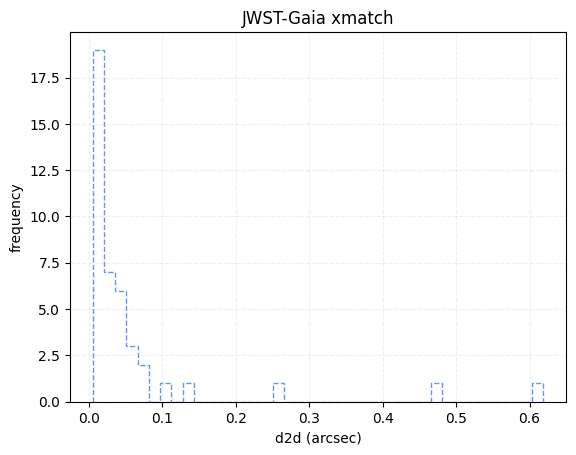

0.028053273048540026

In [75]:
calc_dispersion(tb_gaia, align_image.replace('_i2d.fits', '.phot.txt'), phot_image = align_image, plot = True, inspect_large_offset=True)

In [72]:
jwst_phot = jwst_photclass()
phot_img = glob.glob(align_image.replace('i2d.fits', 'jhat_i2d.fits'))[0]
jwst_phot.run_phot(imagename=phot_img,
                   photfilename='jwstred_temp_gaia/jhat_corr_phot.txt',
                   overwrite=True,
                   ee_radius=70,
#                    use_dq=True,
                   SNR_min = 3,
                   find_stars_threshold = 5)
# ref_catname = ref_image.replace('.fits','.phot.txt') # the default
refcat = Table.read('jwstred_temp_gaia/jhat_corr_phot.txt',format='ascii')
print(refcat)

0 jwstred_temp_gaia/jhat_corr_phot.txt


2025-04-20 02:08:50,200 - stpipe.SourceCatalogStep - INFO - SourceCatalogStep instance created.
2025-04-20 02:08:50,562 - stpipe.SourceCatalogStep - INFO - Using APCORR reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_apcorr_0004.fits
2025-04-20 02:08:50,566 - stpipe.SourceCatalogStep - INFO - Using ABVEGAOFFSET reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_abvegaoffset_0002.asdf
2025-04-20 02:08:50,567 - stpipe - INFO - Instrument: NIRCAM
2025-04-20 02:08:50,567 - stpipe - INFO - Detector: MULTIPLE
2025-04-20 02:08:50,567 - stpipe - INFO - Filter: F115W
2025-04-20 02:08:50,567 - stpipe - INFO - Pupil: CLEAR
2025-04-20 02:08:50,568 - stpipe - INFO - Subarray: FULL


dmag 0.36200000000000004
aper_sum_3.3px annulus_median_3.3px aper_bkg_3.3px ...   x_idl      y_idl   
-------------- -------------------- -------------- ... ---------- ----------
     24.442442             0.392329      13.316796 ...  92.754528 -30.560018
     23.606227             0.343132      11.646891 ...  73.918022 -30.822065
    306.442569             0.386399      13.115498 ...   4.071663 -31.627762
     21.920842             0.360422      12.233775 ...   86.00833 -30.502671
     84.890049             0.321523      10.913424 ...   2.440345 -31.628895
     21.464779             0.317381      10.772855 ...   58.41183  -30.97375
    130.122632             0.322342      10.941219 ...  -3.566363 -31.583237
     37.714628             0.758057       25.73066 ...  100.67292 -29.963931
      75.52968             0.330755      11.226785 ...  47.874989 -30.987702
     30.886624             0.648072      21.997446 ...  99.114309 -29.909995
           ...                  ...            ... 

0.0014057834902850006 0.0006842718681346958 0.0015361432232847757


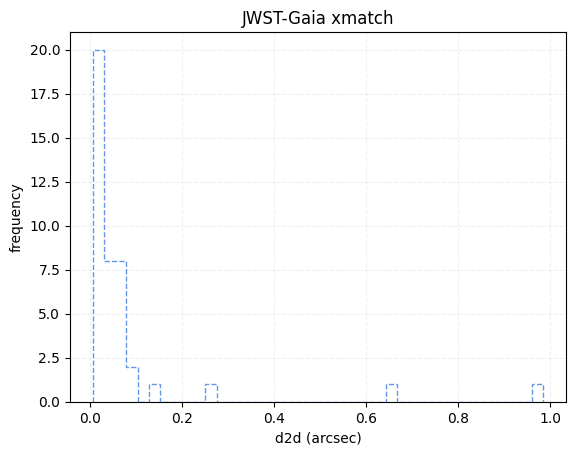

0.03749377935451427

In [73]:
calc_dispersion(tb_gaia, 'jwstred_temp_gaia/jhat_corr_phot.txt', 
                phot_image = phot_img,
                dist_limit = 1.0, plot = True, inspect_large_offset=True)

#### Breakup star mask

In [18]:
jwst_im = fits.open(glob.glob('jwstred_temp_gaia/jw01334001001_02101_00002_nrcblong_cal.fits')[0])

In [19]:
jwst_im.info()

Filename: jwstred_temp_gaia/jw01334001001_02101_00002_nrcblong_cal.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     346   ()      
  1  SCI           1 ImageHDU       156   (2048, 2048)   float32   
  2  ERR           1 ImageHDU        10   (2048, 2048)   float32   
  3  DQ            1 ImageHDU        11   (2048, 2048)   int32 (rescales to uint32)   
  4  AREA          1 ImageHDU         9   (2048, 2048)   float32   
  5  VAR_POISSON    1 ImageHDU         9   (2048, 2048)   float32   
  6  VAR_RNOISE    1 ImageHDU         9   (2048, 2048)   float32   
  7  VAR_FLAT      1 ImageHDU         9   (2048, 2048)   float32   
  8  ASDF          1 BinTableHDU     11   1R x 1C   [26608B]   


In [20]:
dq_mask = deepcopy(jwst_im['DQ'].data)

In [21]:
flag_sat = np.array(dq_mask != 1) & np.array(dq_mask != 2) & np.array(dq_mask != 3)

In [22]:
np.shape(flag_sat), np.shape(dq_mask)

((2048, 2048), (2048, 2048))

In [23]:
flag_sat.sum()

4165548

In [24]:
dq_mask[flag_sat] = 10
dq_mask[~flag_sat] = 1

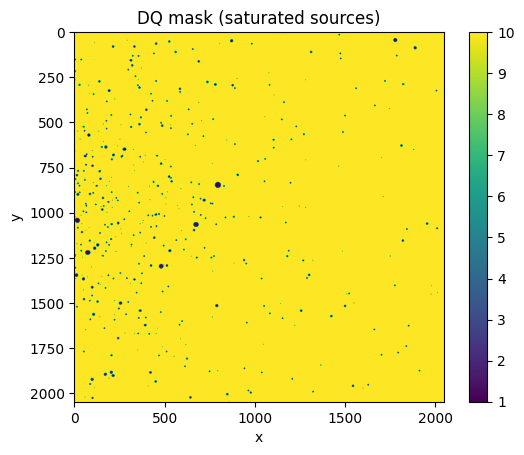

In [26]:
plt.imshow(dq_mask)
plt.colorbar()
plt.xlabel('x')
plt.ylabel('y')
plt.title('DQ mask (saturated sources)')
plt.show()
# plt.savefig('dq_mask.png', bbox_inches = 'tight', dpi = 500)

In [27]:
np.unique(dq_mask)

array([ 1, 10], dtype=uint32)

In [36]:
def expand_mask(mask, size = 40, mask_shape = 'square'):
    """
    Expand the mask by a given size using binary dilation.

    Parameters
    ----------
    mask : numpy.ndarray
        The mask to be expanded.
    size : int
        The size of the structuring element used for binary dilation.
    mask_shape : str
        The shape of the structuring element. Can be 'square' or 'circle'.

    Returns
    -------
    mask_exp : numpy.ndarray
        The expanded mask.
    """
    # Create a binary mask where pixels with flag 1 are set to True
    binary_mask = (mask == 1)
    
    # Define a structuring element
    if mask_shape == 'square':
        structuring_element = np.ones((size, size), dtype=bool)
    if mask_shape == 'circle':
        y, x = np.ogrid[:size, :size]
        center = (size-1)/2
        structuring_element = (x - center)**2 + (y - center)**2 <= center**2
    
    expanded_mask = binary_dilation(binary_mask, structure=structuring_element)
    
    # Convert the expanded binary mask back to the original mask format
    mask_exp = np.where(expanded_mask, 1, mask)
    
    return mask_exp

In [41]:
expmask = expand_mask(dq_mask, mask_shape = 'circle')
expmask[expmask == 1] = False
expmask[expmask == 10] = True
# expmask[expmask == 1] = True

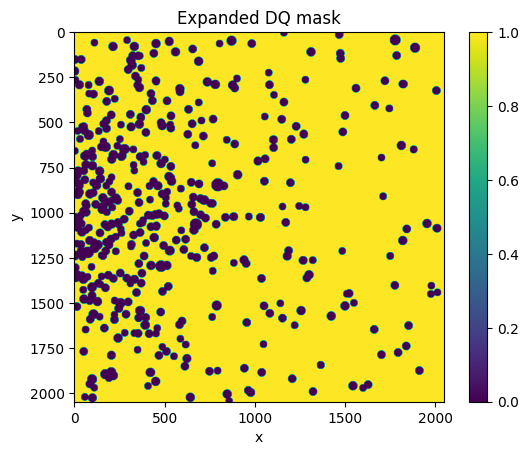

In [42]:
# expmask[expmask > 10] = 10
plt.imshow(expmask)
plt.colorbar()
plt.xlabel('x')
plt.ylabel('y')
plt.title('Expanded DQ mask')
plt.show()
# plt.savefig('exp_dq_mask.png', bbox_inches = 'tight', dpi = 500)

In [43]:
expmask

array([[1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       ...,
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1]], dtype=uint32)

In [17]:
plt.imshow(jwst_im['SCI'].data, vmin = np.nanmedian(jwst_im['SCI'].data) - 1*np.nanstd(jwst_im['SCI'].data),
                                vmax = np.nanmedian(jwst_im['SCI'].data) + 1*np.nanstd(jwst_im['SCI'].data))
plt.colorbar()

In [307]:
# masked_im = np.where(dq_mask, jwst_im['SCI'].data, 3)
masked_im = np.where(expmask, jwst_im['SCI'].data, np.nan)

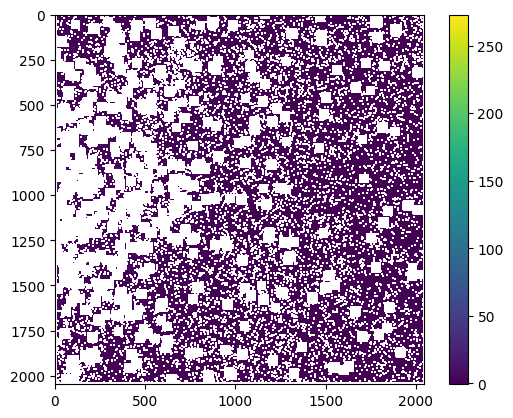

In [308]:
plt.imshow(masked_im)
plt.colorbar()

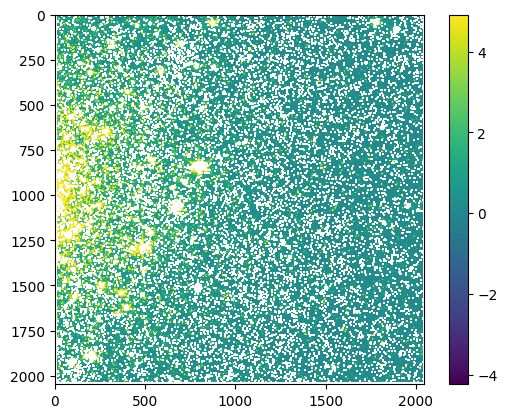

In [38]:
plt.imshow(masked_im, vmin = np.nanmedian(masked_im) - 1*np.nanstd(masked_im),
                      vmax = np.nanmedian(masked_im) + 1*np.nanstd(masked_im))
plt.colorbar()

In [309]:
jwst_im['SCI'].data = masked_im

In [44]:
# bin_dq_hdu = 
data, hdr = fits.getdata('jwstred_temp_gaia/jw01334001001_02101_00002_nrcblong_cal.fits', ext=3, header=True)
# bin_dq_data = np.where(expmask, jwst_im['DQ'].data, 3)
hdr['extname'] = 'BIN_DQ'
image_hdu = fits.ImageHDU(data=expmask, name="BIN_DQ", header = hdr)
jwst_im.insert(8, image_hdu)
# bin_dq_hdu

In [45]:
jwst_im.info()

Filename: jwstred_temp_gaia/jw01334001001_02101_00002_nrcblong_cal.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     346   ()      
  1  SCI           1 ImageHDU       156   (2048, 2048)   float32   
  2  ERR           1 ImageHDU        10   (2048, 2048)   float32   
  3  DQ            1 ImageHDU        11   (2048, 2048)   uint32   
  4  AREA          1 ImageHDU         9   (2048, 2048)   float32   
  5  VAR_POISSON    1 ImageHDU         9   (2048, 2048)   float32   
  6  VAR_RNOISE    1 ImageHDU         9   (2048, 2048)   float32   
  7  VAR_FLAT      1 ImageHDU         9   (2048, 2048)   float32   
  8  BIN_DQ        1 ImageHDU        11   (2048, 2048)   uint32   
  9  ASDF          1 BinTableHDU     11   1R x 1C   [26608B]   


In [46]:
jwst_im.writeto('jwstred_temp_gaia/jw01334001001_02101_00002_nrcblong_cal_masked.fits', overwrite = True)

In [48]:
def add_bin_dq(filename):
    im = fits.open(filename)
    dq_mask = deepcopy(im['DQ'].data)

    flag_sat = np.array(dq_mask != 1) & np.array(dq_mask != 2) & np.array(dq_mask != 3)
    dq_mask[flag_sat] = 10
    dq_mask[~flag_sat] = 1

    expmask = expand_mask(dq_mask, mask_shape = 'circle')
    expmask[expmask == 10] = False
    expmask[expmask == 1] = True

    data, hdr = fits.getdata(filename, ext=3, header=True)
    hdr['extname'] = 'BIN_DQ'
    image_hdu = fits.ImageHDU(data=expmask, name="BIN_DQ", header = hdr)
    im.insert(8, image_hdu)
    im.writeto(filename.replace('.fits', '_masked.fits'), overwrite = True)


In [49]:
add_bin_dq('jwstred_temp_gaia/jw01334001001_02101_00002_nrcblong_cal.fits')

In [51]:
im = fits.open('jwstred_temp_gaia/jw01334001001_02101_00002_nrcblong_cal_masked.fits')

In [ ]:
def prepare_image(data_original, imhdr, area=None, dq=None, 
                  DNunits=False, dq_ignore_bits = 4):
    # dq_ignore_bits contains the bits in the dq which are still ok, so they
    # should be ignored.
    # 2 = Pixel saturated during integration
    # 4 = Jump detected during integration

    if area is not None:

        if self.verbose: print('Applying Pixel Area Map')

        data_pam = data_original * area

    else:

        data_pam = data_original

    if DNunits:
        if imhdr["BUNIT"]!='MJy/sr':
            raise RuntimeError(f'imhdr["BUNIT"]={imhdr["BUNIT"]} is not MJy/sr!')
        if self.verbose: print(f'Converting units from {imhdr["BUNIT"]} to DN/s')
        data = data_pam / imhdr['PHOTMJSR']
    else:
        data = data_pam


    if dq is not None:
        # dq_ignore_bits are removed from the mask!
        #fits.writeto('TEST_dq_delme.fits',dq,overwrite=True,output_verify='ignore')
        mask = np.bitwise_and(dq,np.full(data_original.shape, ~dq_ignore_bits, dtype='int'))
    else:
        mask = np.zeros(data_original.shape, dtype='int')

    # hijack a few bits for our purposes...
    mask[np.isnan(data)==True] = 8
    mask[np.isfinite(data)==False] = 8
    mask[np.where(data==0)] = 16

    #fits.writeto('TEST_mask_delme.fits',mask,overwrite=True,output_verify='ignore')

    data[mask>0] = np.nan

    return data,mask,DNunits

In [19]:
test_im = fits.open('jwstred_temp_gaia/jw01334001001_02101_00002_nrcblong_cal.fits')

In [20]:
test_im.info()

Filename: jwstred_temp_gaia/jw01334001001_02101_00002_nrcblong_cal.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     346   ()      
  1  SCI           1 ImageHDU       156   (2048, 2048)   float32   
  2  ERR           1 ImageHDU        10   (2048, 2048)   float32   
  3  DQ            1 ImageHDU        11   (2048, 2048)   int32 (rescales to uint32)   
  4  AREA          1 ImageHDU         9   (2048, 2048)   float32   
  5  VAR_POISSON    1 ImageHDU         9   (2048, 2048)   float32   
  6  VAR_RNOISE    1 ImageHDU         9   (2048, 2048)   float32   
  7  VAR_FLAT      1 ImageHDU         9   (2048, 2048)   float32   
  8  BIN_DQ        1 ImageHDU        11   (2048, 2048)   int32 (rescales to uint32)   
  9  ASDF          1 BinTableHDU     11   1R x 1C   [26608B]   


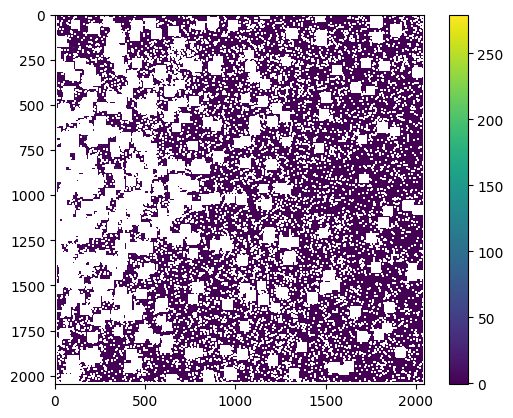

In [24]:
plt.imshow(data)
plt.colorbar()

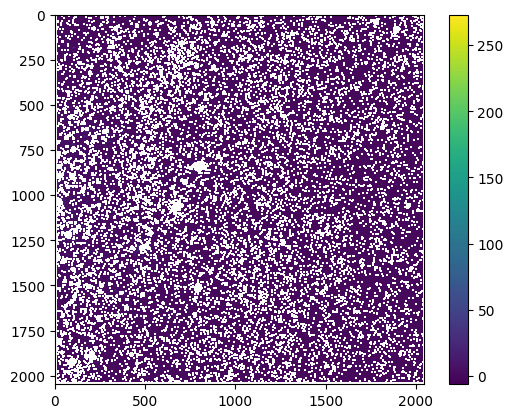

In [15]:
plt.imshow(test_im['SCI'].data)
plt.colorbar()

In [275]:
dq = test_im['BIN_DQ'].data
og_data = np.array(test_im['SCI'].data)
dq_ignore_bits = 4
mask = np.bitwise_and(dq, np.full(og_data.shape, ~dq_ignore_bits, dtype = 'int'))

In [247]:
dq

array([[2151153665, 2151153665, 2151153665, ..., 2151153665, 2151153665,
        2151153665],
       [2151153665, 2151153665, 2151153665, ..., 2151153665, 2151153665,
        2151153665],
       [2151153665, 2151153665, 2151153665, ..., 2151153665, 2151153665,
        2151153665],
       ...,
       [2155347969, 2151153665, 2151153665, ..., 2151153665, 2151153665,
        2151153665],
       [2151153665, 2151153665, 2151153665, ..., 2151153665, 2151153665,
        2151153665],
       [2151153665, 2151153665, 2151153665, ..., 2151153665, 2151153665,
        2151153665]], dtype=uint32)

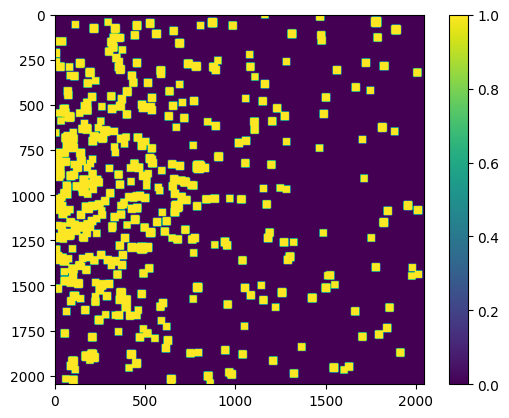

In [276]:
# mask = np.array(mask, dtype = 'float32')
# mask[mask>0] = np.nan
plt.imshow(mask)
plt.colorbar()

In [148]:
np.bitwise_and(np.array([1]), np.array([5]))

array([1])

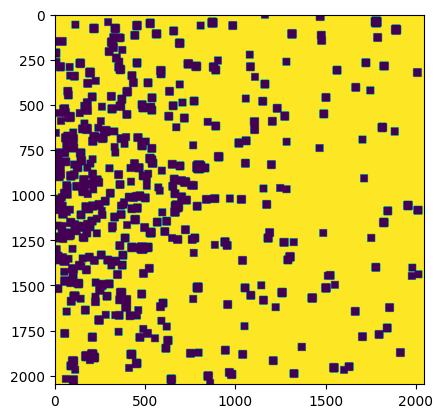

In [142]:
plt.imshow(dq)